Published on May 19, 2025. By end_of_night.17j03

**Retrieved from:** https://www.kaggle.com/code/endofnight17j03/fathomnet-2025-cvpr-fgvc

In [1]:
import json
import codecs
import requests
import pandas as pd

from PIL import Image
from io import BytesIO
from urllib.request import urlopen

## Pandalus platyceros and two possible Octopus rubescens

https://database.fathomnet.org/fathomnet/#/imagedetails/b7a3c3c8-8380-45bd-a6d8-fec45a23d251

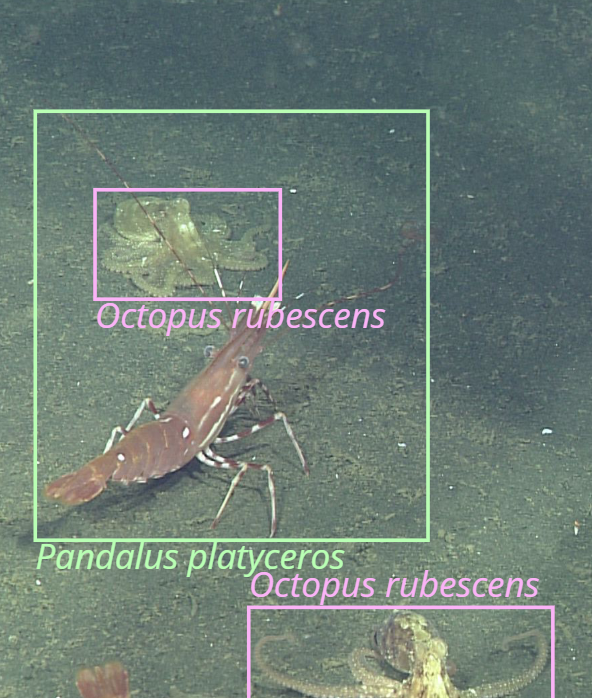

### Competition Overview.

"Consider marine wildlife monitoring in coastal waters near California. Daily video footage analyzed by a standard ML model shows 2 octopuses, 1 shark, and 10 jellyfish - broad taxonomic categories. But species-level identification could reveal crucial details. Is that an Octopus rubescens, commonly found in this area, or is it an Octopus cyanea usually only observed in warm, tropical waters near Hawai’i? Accurate species classification is essential for understanding ocean ecosystems."

https://www.kaggle.com/competitions/fathomnet-2025

## Competition Citation

@misc{fathomnet-2025,

    author = {eor123 and Kevin Barnard and Laura Chrobak and picekl},
    
    title = {FathomNet 2025 @ CVPR-FGVC},
    
    year = {2025},
    howpublished = {\url{https://kaggle.com/competitions/fathomnet-2025}},

### Load train file

In [2]:
df = pd.read_json("../data/dataset_train.json", typ="series")

df.tail()

info           {'year': 2025, 'version': '0', 'description': ...
images         [{'id': 1, 'width': 720, 'height': 368, 'file_...
licenses       [{'id': 0, 'name': 'FathomNet', 'url': 'http:/...
annotations    [{'id': 1, 'image_id': 1, 'category_id': 71, '...
categories     [{'id': 1, 'name': 'Abyssocucumis abyssorum', ...
dtype: object

## Options to open json

In [3]:
# df = pd.read_json('../input/cusersmarildownloadsdata-json/data.json', encoding = 'utf-8-sig')

# input_df = pd.read_json('../input/traffic-violations/data.json', lines=True, orient="columns")

# data= pd.read_json('../input/traffic-violations/data.json', lines=True)

# data= pd.read_json('../input/traffic-violations/data.json', lines=True, orient='records')

# data= pd.read_json('../input/traffic-violations/data.json', orient=str)

# data= pd.read_json('../input/traffic-violations/data.json', typ="series")

# df = pd.read_json(path_or_buf='/kaggle/input/en-to-ko/EN_TO_KO.json')

In [4]:
# Code by Ventakumar R https://www.kaggle.com/venkatkumar001/hfp-2-eda-tensorflow/notebook
with codecs.open(
    "../data/dataset_train.json", "r", encoding="utf-8", errors="ignore"
) as f:
    train_meta = json.load(f)

with codecs.open(
    "../data/dataset_test.json", "r", encoding="utf-8", errors="ignore"
) as f:
    test_meta = json.load(f)

In [5]:
# Code by Ventakumar R https://www.kaggle.com/venkatkumar001/hfp-2-eda-tensorflow/notebook

display(train_meta.keys())

dict_keys(['info', 'images', 'licenses', 'annotations', 'categories'])

In [6]:
# Code by Ventakumar R https://www.kaggle.com/venkatkumar001/hfp-2-eda-tensorflow/notebook

display(test_meta.keys())

dict_keys(['info', 'images', 'licenses', 'annotations', 'categories'])

### Where are the Supercategories below?

In [7]:
# Code by Ventakumar R https://www.kaggle.com/venkatkumar001/hfp-2-eda-tensorflow/notebook

fath = pd.DataFrame(train_meta["categories"])

display(fath)

,id,name,supercategory
0,1,Abyssocucumis abyssorum,
1,2,Acanthascinae,
2,3,Acanthoptilum,
3,4,Actinernus,
4,5,Actiniaria,
...,...,...,...
74,75,Terebellidae,
75,76,Tunicata,
76,77,Umbellula,
77,78,Vesicomyidae,


### Get the Whole list of names

In [8]:
fath_list = fath.get("name").tolist()
print(fath_list)

['Abyssocucumis abyssorum', 'Acanthascinae', 'Acanthoptilum', 'Actinernus', 'Actiniaria', 'Actinopterygii', 'Amphipoda', 'Apostichopus leukothele', 'Asbestopluma', 'Asbestopluma monticola', 'Asteroidea', 'Benthocodon pedunculata', 'Brisingida', 'Caridea', 'Ceriantharia', 'Chionoecetes tanneri', 'Chorilia longipes', 'Corallimorphus pilatus', 'Crinoidea', 'Delectopecten', 'Elpidia', 'Farrea', 'Florometra serratissima', 'Funiculina', 'Gastropoda', 'Gersemia juliepackardae', 'Heterocarpus', 'Heterochone calyx', 'Heteropolypus ritteri', 'Hexactinellida', 'Hippasteria', 'Holothuroidea', 'Hormathiidae', 'Isidella tentaculum', 'Isididae', 'Isosicyonis', 'Keratoisis', 'Liponema brevicorne', 'Lithodidae', 'Mediaster aequalis', 'Merluccius productus', 'Metridium farcimen', 'Microstomus pacificus', 'Munidopsis', 'Munnopsidae', 'Mycale', 'Octopus rubescens', 'Ophiacanthidae', 'Ophiuroidea', 'Paelopatides confundens', 'Pandalus amplus', 'Pandalus platyceros', 'Pannychia moseleyi', 'Paragorgia', 'Par

### Octopus rubescens is on 46 entry.

In [9]:
print(fath.name.to_string(index=True))

0         Abyssocucumis abyssorum
1                   Acanthascinae
2                   Acanthoptilum
3                      Actinernus
4                      Actiniaria
5                  Actinopterygii
6                       Amphipoda
7         Apostichopus leukothele
8                    Asbestopluma
9          Asbestopluma monticola
10                     Asteroidea
11        Benthocodon pedunculata
12                     Brisingida
13                        Caridea
14                   Ceriantharia
15           Chionoecetes tanneri
16              Chorilia longipes
17         Corallimorphus pilatus
18                      Crinoidea
19                  Delectopecten
20                        Elpidia
21                         Farrea
22        Florometra serratissima
23                     Funiculina
24                     Gastropoda
25        Gersemia juliepackardae
26                   Heterocarpus
27              Heterochone calyx
28          Heteropolypus ritteri
29            

## Octopus rubescens id number (46) since it starts on zero

In [10]:
rubescens = fath[(fath["name"] == "Octopus rubescens")].reset_index(drop=True)
rubescens.head()

,id,name,supercategory
0,47,Octopus rubescens,


In [11]:
# Code by Ventakumar R https://www.kaggle.com/venkatkumar001/hfp-2-eda-tensorflow/notebook

fath1 = pd.DataFrame(train_meta["images"])
display(fath1)

,id,width,height,file_name,license,flickr_url,coco_url,date_captured
0,1,720,368,67cda248-6d28-4801-9c4e-e4525189ea38.png,0,https://database.fathomnet.org/static/m3/frame...,https://database.fathomnet.org/static/m3/frame...,2008-12-19 19:46:56
1,2,1920,1080,d9b399f3-8628-4138-a339-f4520be751c5.png,0,https://database.fathomnet.org/static/m3/frame...,https://database.fathomnet.org/static/m3/frame...,2019-05-30 16:41:04
2,3,1920,1080,3289c3e1-40f2-4512-992f-3fa406b50a86.png,0,https://database.fathomnet.org/static/m3/frame...,https://database.fathomnet.org/static/m3/frame...,2014-06-05 20:04:19
3,4,1920,1080,801dc37d-1aac-49ac-9067-93ae4bb7c8b6.png,0,https://database.fathomnet.org/static/m3/frame...,https://database.fathomnet.org/static/m3/frame...,2017-12-21 15:37:28
4,5,1920,1080,0026b62d-3ebc-4a70-b62e-5767a4e5f8b8.png,0,https://database.fathomnet.org/static/m3/frame...,https://database.fathomnet.org/static/m3/frame...,2021-08-14 16:25:58
...,...,...,...,...,...,...,...,...
8976,8977,713,368,ce8a2afa-c950-408e-bbec-bbcb0d68b16c.png,0,https://database.fathomnet.org/static/m3/frame...,https://database.fathomnet.org/static/m3/frame...,2006-04-28 23:27:50
8977,8978,720,368,823e9aee-2c92-453d-82a6-8d13fd73688b.png,0,https://database.fathomnet.org/static/m3/frame...,https://database.fathomnet.org/static/m3/frame...,2009-09-08 15:39:43
8978,8979,1920,1080,e306c26d-431d-40f8-bc9c-4a6b4521d825.png,0,https://database.fathomnet.org/static/m3/frame...,https://database.fathomnet.org/static/m3/frame...,2013-01-09 20:48:36
8979,8980,720,368,82c482b9-ca59-4557-9be1-5a228f62558a.png,0,https://database.fathomnet.org/static/m3/frame...,https://database.fathomnet.org/static/m3/frame...,2009-09-08 15:32:00


In [12]:
# read JSON file
f = open("../data/dataset_train.json")
dict_train = json.load(f)

In [13]:
# info section
dict_train["info"]

{'year': 2025,
 'version': '0',
 'description': 'Generated by FathomNet',
 'contributor': 'FathomNet',
 'url': 'https://database.fathomnet.org',
 'date_created': '2025/01/08'}

## Image Section:

In [14]:
# convert image section to data frame
df_train_images = pd.json_normalize(dict_train["images"])
# we can remove "license" as this is always 0
df_train_images.drop(["license"], axis=1, inplace=True)
# show preview
df_train_images.head(5)

,id,width,height,file_name,flickr_url,coco_url,date_captured
0,1,720,368,67cda248-6d28-4801-9c4e-e4525189ea38.png,https://database.fathomnet.org/static/m3/frame...,https://database.fathomnet.org/static/m3/frame...,2008-12-19 19:46:56
1,2,1920,1080,d9b399f3-8628-4138-a339-f4520be751c5.png,https://database.fathomnet.org/static/m3/frame...,https://database.fathomnet.org/static/m3/frame...,2019-05-30 16:41:04
2,3,1920,1080,3289c3e1-40f2-4512-992f-3fa406b50a86.png,https://database.fathomnet.org/static/m3/frame...,https://database.fathomnet.org/static/m3/frame...,2014-06-05 20:04:19
3,4,1920,1080,801dc37d-1aac-49ac-9067-93ae4bb7c8b6.png,https://database.fathomnet.org/static/m3/frame...,https://database.fathomnet.org/static/m3/frame...,2017-12-21 15:37:28
4,5,1920,1080,0026b62d-3ebc-4a70-b62e-5767a4e5f8b8.png,https://database.fathomnet.org/static/m3/frame...,https://database.fathomnet.org/static/m3/frame...,2021-08-14 16:25:58


## Annotations section:

In [15]:
# convert annotations section to data frame
df_train_annots = pd.json_normalize(dict_train["annotations"])
# show preview
df_train_annots.head(10)

,id,image_id,category_id,segmentation,area,bbox,iscrowd
0,1,1,71,[],943.0,"[491.0, 254.0, 23.0, 41.0]",0
1,2,2,8,[],71577.0,"[701.0, 505.0, 241.0, 297.0]",0
2,3,3,67,[],533148.0,"[458.0, 332.0, 924.0, 577.0]",0
3,4,4,37,[],299186.0,"[1155.0, 71.0, 659.0, 454.0]",0
4,5,4,37,[],520650.0,"[66.0, 6.0, 975.0, 534.0]",0
5,6,5,45,[],9202.0,"[823.0, 833.0, 86.0, 107.0]",0
6,7,6,68,[],41475.0,"[1346.0, 460.0, 237.0, 175.0]",0
7,8,7,71,[],5916.0,"[1290.0, 426.0, 87.0, 68.0]",0
8,9,7,16,[],8600.0,"[1180.0, 289.0, 100.0, 86.0]",0
9,10,7,71,[],9450.0,"[139.0, 723.0, 135.0, 70.0]",0


## Remove segmentation (empty brackets) and iscrowd (zeros)

In [16]:
# remove columns w/o info
df_train_annots.drop(["segmentation", "iscrowd"], axis=1, inplace=True)

In [17]:
# aux function (remove suffix ".png" from file name)
def drop_suffix(i_str):
    length = len(i_str)
    return i_str[0 : (length - 4)]


# add filename-based id to image table in order to be able to join with df_train
df_train_images["id_file"] = df_train_images.file_name.apply(drop_suffix)

## Add labels from df_train/train.csv to image table:

In [18]:
# aux function (remove suffix ".png" from file name)
def drop_suffix(i_str):
    length = len(i_str)
    return i_str[0 : (length - 4)]


# add filename-based id to image table in order to be able to join with df_train
df_train_images["id_file"] = df_train_images.file_name.apply(drop_suffix)

## Trying some Images. Add "Database" to the urls to display them!

In [19]:
##Code by Arian Ghasemi https://www.kaggle.com/code/arianghasemi/display-images/notebook
# https://www.kaggle.com/code/mpwolke/backpacks-image-url

from IPython.core.display import HTML


def path_to_image_html(path):
    return '<img src="' + path + '" width="60" >'


HTML(fath1[0:7].to_html(escape=False, formatters=dict(coco_url=path_to_image_html)))

,id,width,height,file_name,license,flickr_url,coco_url,date_captured
0,1,720,368,67cda248-6d28-4801-9c4e-e4525189ea38.png,0,https://database.fathomnet.org/static/m3/framegrabs/Ventana/images/3317/01_17_26_19.png,,2008-12-19 19:46:56
1,2,1920,1080,d9b399f3-8628-4138-a339-f4520be751c5.png,0,https://database.fathomnet.org/static/m3/framegrabs/Ventana/images/4194/20190530T164104Z-60628e6f-6398-4267-9757-288078efec28.png,,2019-05-30 16:41:04
2,3,1920,1080,3289c3e1-40f2-4512-992f-3fa406b50a86.png,0,https://database.fathomnet.org/static/m3/framegrabs/Doc%20Ricketts/images/0617/01_43_19_24.png,,2014-06-05 20:04:19
3,4,1920,1080,801dc37d-1aac-49ac-9067-93ae4bb7c8b6.png,0,https://database.fathomnet.org/static/m3/framegrabs/Doc%20Ricketts/images/1000/00_49_08_07.png,,2017-12-21 15:37:28
4,5,1920,1080,0026b62d-3ebc-4a70-b62e-5767a4e5f8b8.png,0,https://database.fathomnet.org/static/m3/framegrabs/Doc%20Ricketts/images/1376/20210814T162558.344Z--ca59deda-72cb-49c5-a159-98f13741a7b3.png,,2021-08-14 16:25:58
5,6,1920,1080,f0d3c132-de35-470e-8623-36848711daee.png,0,https://database.fathomnet.org/static/m3/framegrabs/Doc%20Ricketts/images/0673/03_39_51_29.png,,2014-10-13 21:53:22
6,7,1920,1080,32209bb5-4fea-4379-9484-85c5cdb24e9a.png,0,https://database.fathomnet.org/static/m3/framegrabs/Doc%20Ricketts/images/0976/06_16_31_17.png,,2017-08-04 21:04:29


In [20]:
def path_to_image_html1(path1):
    return '<img src="' + path1 + '" width="60" >'


HTML(fath1[0:5].to_html(escape=False, formatters=dict(flickr_url=path_to_image_html1)))

,id,width,height,file_name,license,flickr_url,coco_url,date_captured
0,1,720,368,67cda248-6d28-4801-9c4e-e4525189ea38.png,0,,https://database.fathomnet.org/static/m3/framegrabs/Ventana/images/3317/01_17_26_19.png,2008-12-19 19:46:56
1,2,1920,1080,d9b399f3-8628-4138-a339-f4520be751c5.png,0,,https://database.fathomnet.org/static/m3/framegrabs/Ventana/images/4194/20190530T164104Z-60628e6f-6398-4267-9757-288078efec28.png,2019-05-30 16:41:04
2,3,1920,1080,3289c3e1-40f2-4512-992f-3fa406b50a86.png,0,,https://database.fathomnet.org/static/m3/framegrabs/Doc%20Ricketts/images/0617/01_43_19_24.png,2014-06-05 20:04:19
3,4,1920,1080,801dc37d-1aac-49ac-9067-93ae4bb7c8b6.png,0,,https://database.fathomnet.org/static/m3/framegrabs/Doc%20Ricketts/images/1000/00_49_08_07.png,2017-12-21 15:37:28
4,5,1920,1080,0026b62d-3ebc-4a70-b62e-5767a4e5f8b8.png,0,,https://database.fathomnet.org/static/m3/framegrabs/Doc%20Ricketts/images/1376/20210814T162558.344Z--ca59deda-72cb-49c5-a159-98f13741a7b3.png,2021-08-14 16:25:58


## Trying to find an Octopus rubescens image

Maybe it could be found on 46, according to the input 95 above.

In [21]:
samp = df_train_images[(df_train_images["id"] == 46)].reset_index(drop=True)
samp.head()

,id,width,height,file_name,flickr_url,coco_url,date_captured,id_file
0,46,720,366,450fed6b-103c-4eec-b4f6-10ab4592a02d.png,https://database.fathomnet.org/static/m3/frame...,https://database.fathomnet.org/static/m3/frame...,2013-12-16 17:36:54,450fed6b-103c-4eec-b4f6-10ab4592a02d


In [22]:
samp["coco_url"][0]

'https://database.fathomnet.org/static/m3/framegrabs/Doc%20Ricketts/images/0573/01_05_29_17.png'

In [23]:
# get an example image
# my_row = 3
# my_url = df_train_with_labels.coco_url[my_row]
# my_url

my_url = "https://fathomnet.org/static/m3/framegrabs/Doc%20Ricketts/images/0617/01_43_19_24.png"
my_url

'https://fathomnet.org/static/m3/framegrabs/Doc%20Ricketts/images/0617/01_43_19_24.png'

### Add "Database" to the Url to avoid Error 404.

In [24]:
my_url = "https://database.fathomnet.org/static/m3/framegrabs/Ventana/images/4194/20190530T164104Z-60628e6f-6398-4267-9757-288078efec28.png"
my_url

'https://database.fathomnet.org/static/m3/framegrabs/Ventana/images/4194/20190530T164104Z-60628e6f-6398-4267-9757-288078efec28.png'

## Trying with urllib

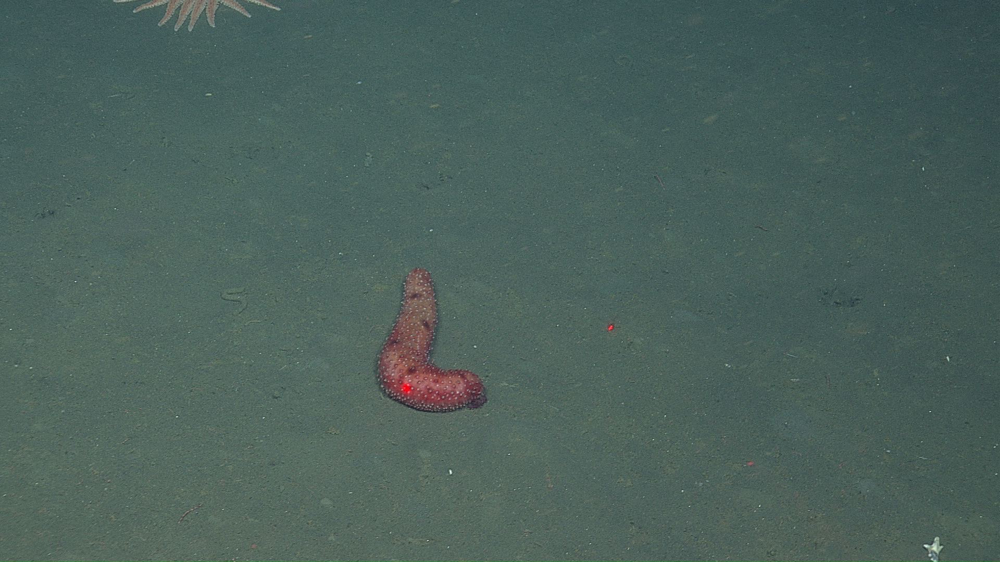

In [25]:
img = Image.open(urlopen(my_url))
img

### Another image.

In [26]:
my_database_url = "https://database.fathomnet.org/static/m3/framegrabs/Doc%20Ricketts/images/1376/20210814T162558.344Z--ca59deda-72cb-49c5-a159-98f13741a7b3.png"
my_database_url

'https://database.fathomnet.org/static/m3/framegrabs/Doc%20Ricketts/images/1376/20210814T162558.344Z--ca59deda-72cb-49c5-a159-98f13741a7b3.png'

### Get requests

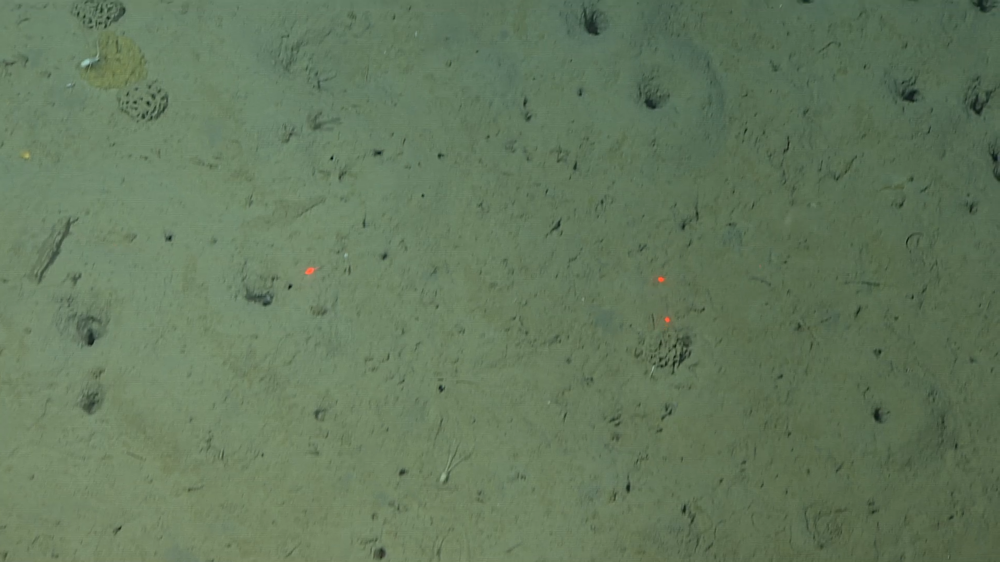

In [27]:
im = Image.open(requests.get(my_database_url, stream=True).raw)
im

In [28]:
my_url_data = "https://database.fathomnet.org/static/m3/framegrabs/Doc%20Ricketts/images/1000/00_49_08_07.png"
my_url_data

'https://database.fathomnet.org/static/m3/framegrabs/Doc%20Ricketts/images/1000/00_49_08_07.png'

## Trying with requests and BytesIO

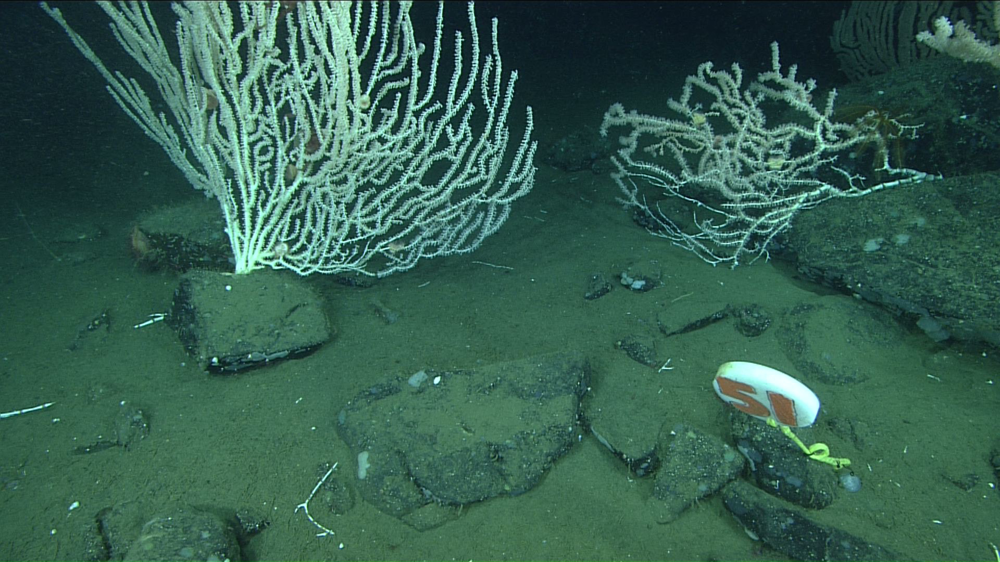

In [29]:
# load and display image (credits: https://stackoverflow.com/questions/7391945/how-do-i-read-image-data-from-a-url-in-python)
response = requests.get(my_url_data)
my_img_train = Image.open(BytesIO(response.content))
my_img_train

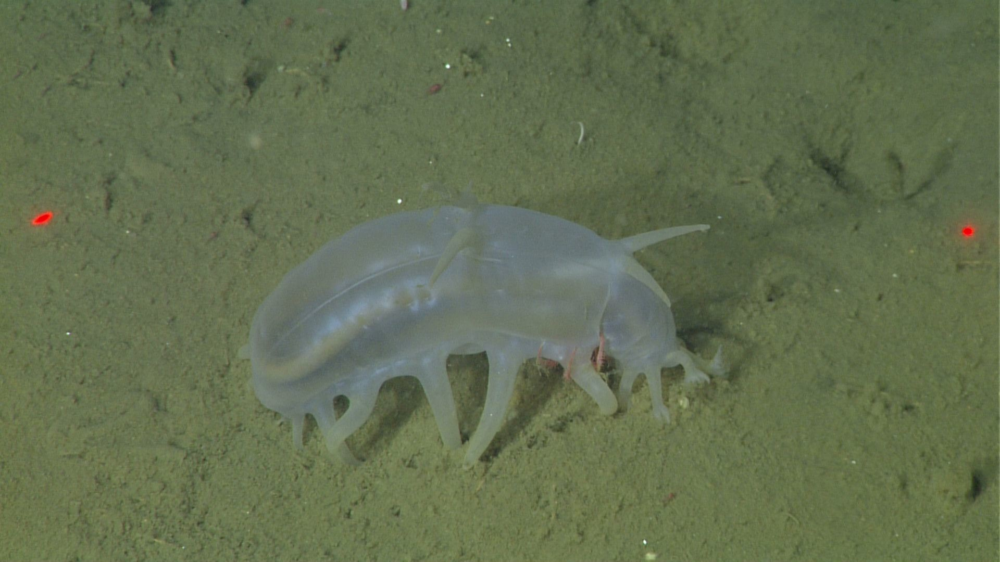

In [30]:
# https://database.fathomnet.org/fathomnet/#/imagedetails/b7a3c3c8-8380-45bd-a6d8-fec45a23d251

import IPython

url = "https://database.fathomnet.org/static/m3/framegrabs/Doc%20Ricketts/images/0617/01_43_19_24.png"
IPython.display.Image(url, width=250)

## No Octopus Image at ALL!!

Maybe it has already scaped from "striking a pose".

In [31]:
# codes from Rodrigo Lima  @rodrigolima82
from IPython.display import Image

Image(
    url="https://database.fathomnet.org/static/m3/framegrabs/Doc%20Ricketts/images/0573/01_05_29_17.png",
    width=400,
    height=400,
)

### To avoid the error on your images, Add "Database" to the url.

Only checking the original FathomNet platform I was able to verify that it requires "Database" to display images.